In [2]:
import pandas as pd, geopandas as gpd, os
import plotly.express as px
import fiona
import matplotlib.pyplot as plt
import leafmap

# Input Data Parameters
Selecting by building class, res units, yearbuilt and within 800m of transit already done in QGIS

The NYC Planning Dpartment categorizes parcel by land use code and by building class.  The following relate to parking facilities:
    Land Use Code = 10 Parking Facilities 
    Building Classes = G0,G1,G6,G7,RG,RP,Z2
    
        G. GARAGES AND GASOLINE STATIONS 
        0. Residential Tax Class 1 Garage 
        1. All Parking Garages 
        2. Auto Body/Collision or Auto Repair 
        3. Gas Station with Retail Store 
        4. Gas Station with Service/Auto Repair 
        5. Gas Station only with/without Small Kiosk 
        6. Licensed Parking Lot 
        7. Unlicensed Parking Lot 
        8. Car Sales/Rental with Showroom 
        9. Miscellaneous Garage or Gas Station 
        U. Car Sales/Rental without Showroom 
        W. Car Wash or Lubritorium Facility

        RG Indoor Parking
        RP Outdoor Parking

        Z2 Public Parking Area

In [3]:
#Read Data

# Paths to the GeoJSON files
lots_path = "/Users/tomweatherburn/Library/CloudStorage/OneDrive-Personal/dev/nyc lots/pluto_parkinglots_800m.geojson"
dev_path = "/Users/tomweatherburn/Library/CloudStorage/OneDrive-Personal/dev/nyc lots/pluto_resunits_2015_800m.geojson"

# Read the GeoJSON files into GeoDataFrames
gdf_lots = gpd.read_file(lots_path)
gdf_dev = gpd.read_file(dev_path)


In [4]:
print(gdf_lots.columns)

Index(['OBJECTID', 'Borough', 'Block', 'Lot', 'CD', 'BCT2020', 'BCTCB2020',
       'CT2010', 'CB2010', 'SchoolDist', 'Council', 'ZipCode', 'FireComp',
       'PolicePrct', 'HealthCenterDistrict', 'HealthArea', 'Sanitboro',
       'SanitDistrict', 'SanitSub', 'Address', 'ZoneDist1', 'ZoneDist2',
       'ZoneDist3', 'ZoneDist4', 'Overlay1', 'Overlay2', 'SPDist1', 'SPDist2',
       'SPDist3', 'LtdHeight', 'SplitZone', 'BldgClass', 'LandUse',
       'Easements', 'OwnerType', 'OwnerName', 'LotArea', 'BldgArea', 'ComArea',
       'ResArea', 'OfficeArea', 'RetailArea', 'GarageArea', 'StrgeArea',
       'FactryArea', 'OtherArea', 'AreaSource', 'NumBldgs', 'NumFloors',
       'UnitsRes', 'UnitsTotal', 'LotFront', 'LotDepth', 'BldgFront',
       'BldgDepth', 'Ext', 'ProxCode', 'IrrLotCode', 'LotType', 'BsmtCode',
       'AssessLand', 'AssessTot', 'ExemptTot', 'YearBuilt', 'YearAlter1',
       'YearAlter2', 'HistDist', 'Landmark', 'BuiltFAR', 'ResidFAR', 'CommFAR',
       'FacilFAR', 'BoroCode', 

Average LotArea for gdf_lots: 7165.479086175038


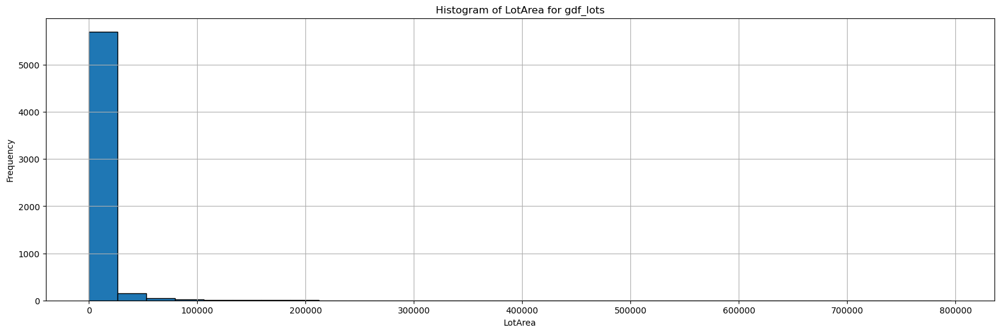

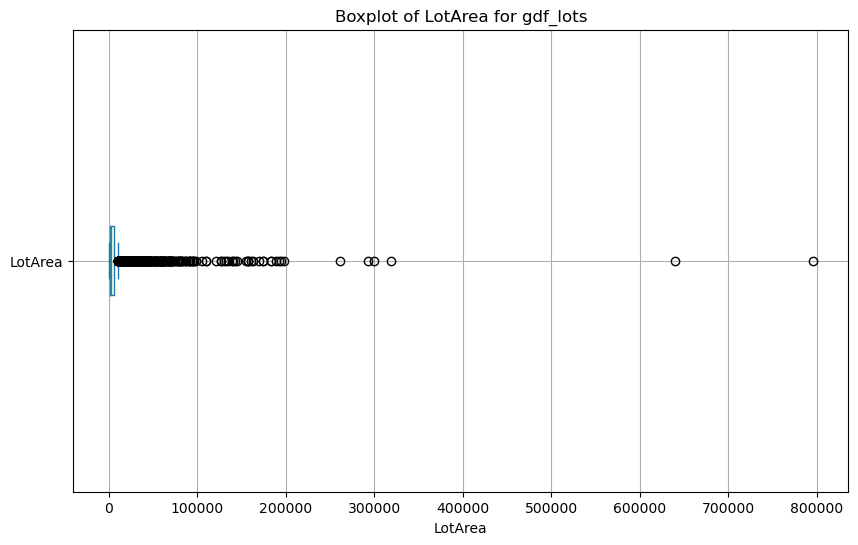

In [5]:
#Calculate the average LotArea for gdf_lots
avg_lotarea_lots = gdf_lots['LotArea'].mean()
print(f"Average LotArea for gdf_lots: {avg_lotarea_lots}")

# Plot histogram for LotArea in gdf_lots
plt.figure(figsize=(20, 6))
gdf_lots['LotArea'].plot(kind='hist', bins=30, edgecolor='black')
plt.title('Histogram of LotArea for gdf_lots')
plt.xlabel('LotArea')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Plot boxplot for LotArea in gdf_lots
plt.figure(figsize=(10, 6))
gdf_lots['LotArea'].plot(kind='box', vert=False)
plt.title('Boxplot of LotArea for gdf_lots')
plt.xlabel('LotArea')
plt.grid(True)
plt.show()

# Create the interactive box plot for LotArea in gdf_lots
fig_lots = px.box(gdf_lots, y='LotArea', title='Boxplot of LotArea for gdf_lots')
fig_lots.show()





What I need to figure out is How many units are likley to be built on lots of the size that most parking lots are currently.  The average lotArea for a parking lot is 2575 sqft.  The range goes up to 11k sqft, within the box and up to 200k sqft without a significant gap.

Average LotArea for gdf_dev: 6732.7012622720895


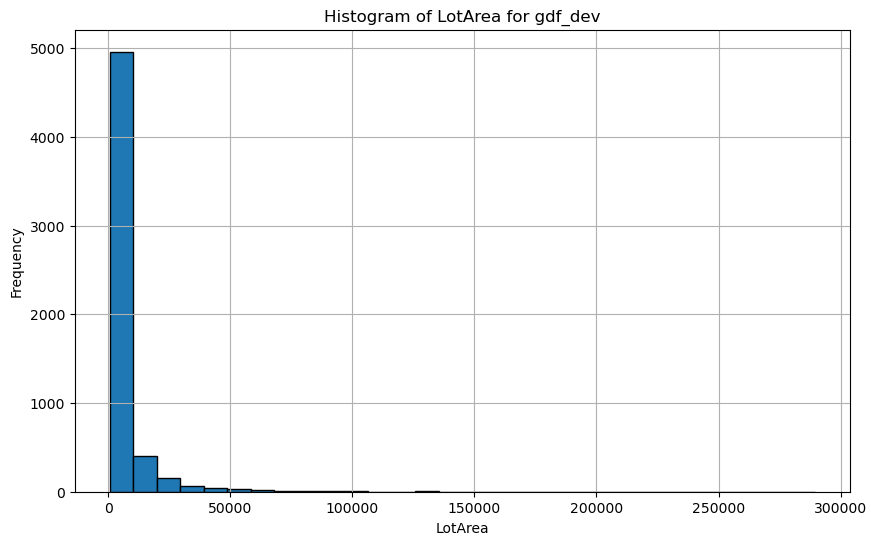

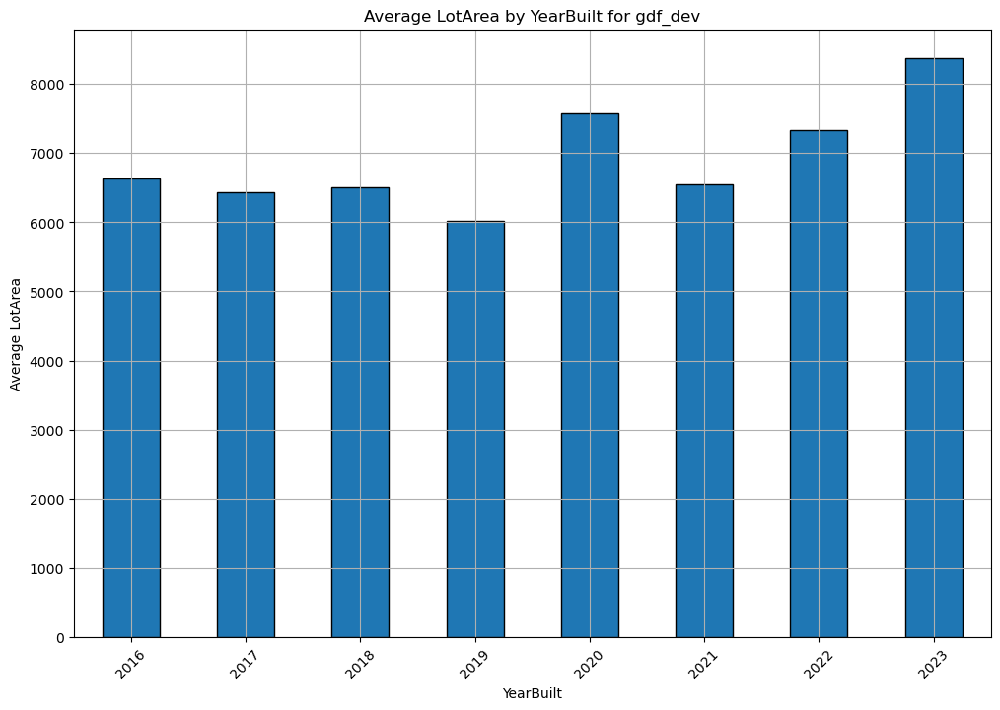

In [6]:
# Calculate the average LotArea for gdf_dev
avg_lotarea_dev = gdf_dev['LotArea'].mean()
print(f"Average LotArea for gdf_dev: {avg_lotarea_dev}")

# Plot histogram for LotArea in gdf_dev
plt.figure(figsize=(10, 6))
gdf_dev['LotArea'].plot(kind='hist', bins=30, edgecolor='black')
plt.title('Histogram of LotArea for gdf_dev')
plt.xlabel('LotArea')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Plot average LotArea by YearBuilt for gdf_dev
avg_lotarea_by_yearbuilt = gdf_dev.groupby('YearBuilt')['LotArea'].mean()

plt.figure(figsize=(12, 8))
avg_lotarea_by_yearbuilt.plot(kind='bar', edgecolor='black')
plt.title('Average LotArea by YearBuilt for gdf_dev')
plt.xlabel('YearBuilt')
plt.ylabel('Average LotArea')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

# Calculate the average ResidFAR by YearBuilt
avg_residfar_by_yearbuilt = gdf_dev.groupby('YearBuilt')['ResidFAR'].mean().reset_index()

# Create the interactive bar plot for average ResidFAR by YearBuilt for gdf_dev
fig_avg_residfar = px.bar(avg_residfar_by_yearbuilt, x='YearBuilt', y='ResidFAR', 
                          title='Average ResidFAR by YearBuilt for gdf_dev')

# Show the plot in the browser
fig_avg_residfar.show()

# Create the interactive scatter plot for LotArea and ResidFAR for gdf_dev
fig_lotarea_unitsres = px.scatter(gdf_dev, x='LotArea', y='UnitsRes', 
                                  title='LotArea vs ResUnits for gdf_dev',
                                  labels={'LotArea': 'Lot Area', 'UnitsRes': 'Residential Units'})

# Show the plot in the browser
fig_lotarea_unitsres.show()

  LotArea_bucket  ResidFAR
0         0-3500  2.097235
1      3501-7000  2.045385
2     7001-11000  3.243322
3         11001+  4.209424


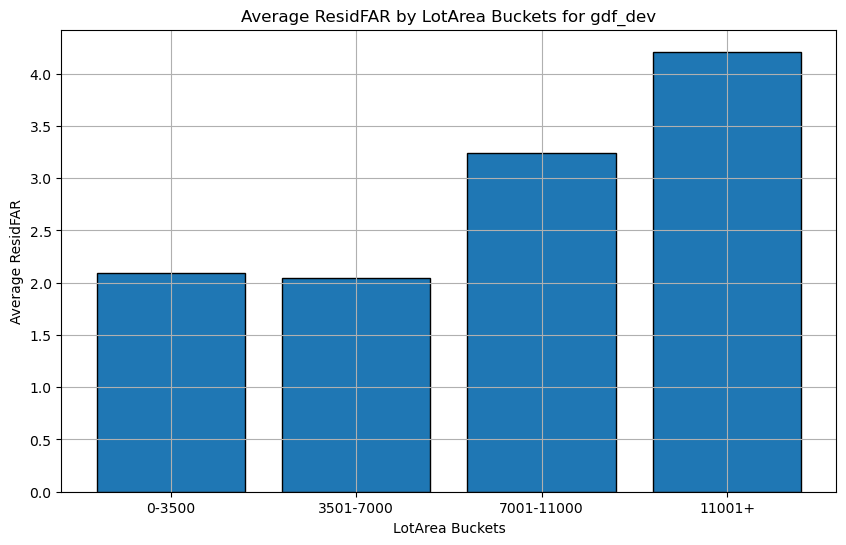

In [23]:
# Define LotArea buckets
bins = [0, 3500, 7000, 11000, float('inf')]
labels = ['0-3500', '3501-7000', '7001-11000', '11001+']

# Add a column to gdf_dev with the LotArea bucket
gdf_dev['LotArea_bucket'] = pd.cut(gdf_dev['LotArea'], bins=bins, labels=labels)

# Calculate the average ResidFAR for each LotArea bucket
avg_residfar_by_bucket = gdf_dev.groupby('LotArea_bucket')['ResidFAR'].mean().reset_index()
print(avg_residfar_by_bucket)

# Plot the average ResidFAR by LotArea buckets
plt.figure(figsize=(10, 6))
plt.bar(avg_residfar_by_bucket['LotArea_bucket'], avg_residfar_by_bucket['ResidFAR'], edgecolor='black')
plt.title('Average ResidFAR by LotArea Buckets for gdf_dev')
plt.xlabel('LotArea Buckets')
plt.ylabel('Average ResidFAR')
plt.grid(True)
plt.show()

  LotArea_bucket    UnitsRes
0         0-3500    5.850773
1      3501-7000   12.532491
2     7001-11000   42.484099
3         11001+  156.094964


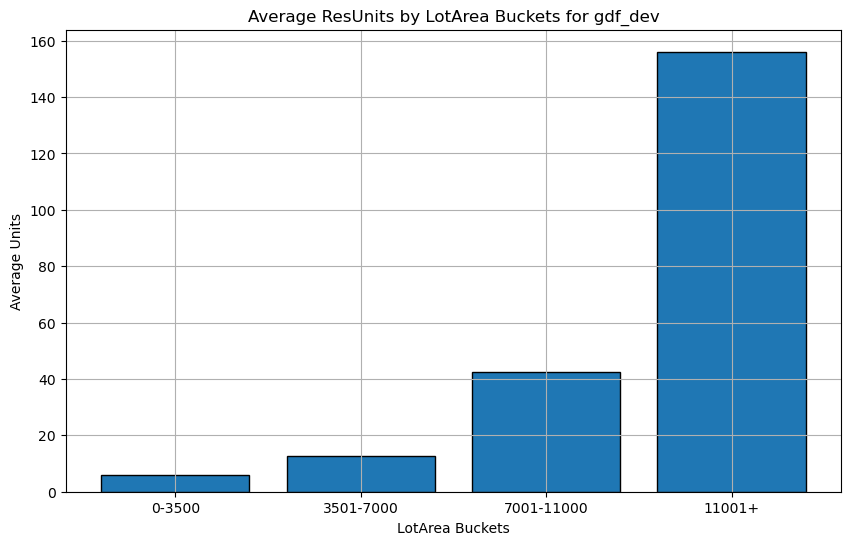

In [7]:
# Define LotArea buckets
bins = [0, 3500, 7000, 11000, float('inf')]
labels = ['0-3500', '3501-7000', '7001-11000', '11001+']

# Add a column to gdf_dev with the LotArea bucket
gdf_dev['LotArea_bucket'] = pd.cut(gdf_dev['LotArea'], bins=bins, labels=labels)

# Calculate the average ResidFAR for each LotArea bucket
avg_residfar_by_bucket = gdf_dev.groupby('LotArea_bucket')['UnitsRes'].mean().reset_index()
print(avg_residfar_by_bucket)

# Plot the average ResidFAR by LotArea buckets
plt.figure(figsize=(10, 6))
plt.bar(avg_residfar_by_bucket['LotArea_bucket'], avg_residfar_by_bucket['UnitsRes'], edgecolor='black')
plt.title('Average ResUnits by LotArea Buckets for gdf_dev')
plt.xlabel('LotArea Buckets')
plt.ylabel('Average Units')
plt.grid(True)
plt.show()

In [15]:
# Create a new variable in gdf_dev called unitLotArea
gdf_dev['unitLotArea'] = gdf_dev['UnitsRes'] / gdf_dev['LotArea']
print(gdf_dev['unitLotArea'].mean())

# Plot unitLotArea in a boxplot using plotly express
fig_unitLotArea = px.box(gdf_dev, x='unitLotArea', title='Boxplot of unitLotArea for gdf_dev',
                         labels={'unitLotArea': 'UnitsRes per LotArea'})

# Show the plot in the browser
fig_unitLotArea.show()

0.003149467925379341


In [16]:
# Calculate the average unitLotArea
avg_unitLotArea = gdf_dev['unitLotArea'].mean()
print(f"Average unitLotArea: {avg_unitLotArea}")

# Create a new field in gdf_lots that multiplies LotArea by the average unitLotArea
gdf_lots['estimated_units'] = gdf_lots['LotArea'] * avg_unitLotArea

# Display the first few rows of gdf_lots with the new field
print(gdf_lots[['LotArea', 'estimated_units']].head(100))

Average unitLotArea: 0.003149467925379341
    LotArea  estimated_units
0     11398        35.897635
1     67342       212.091469
2    183456       577.788788
3     29948        94.320265
4      2241         7.057958
..      ...              ...
95     2369         7.461090
96    12333        38.842388
97     4581        14.427713
98     2323         7.316214
99     7124        22.436810

[100 rows x 2 columns]


In [17]:
#Create point file from gdf_lots
# Calculate centroids for gdf_lots
gdf_lots['centroid'] = gdf_lots.geometry.centroid

# Create a new GeoDataFrame with point geometries based on the centroids
gdf_lots_pt = gpd.GeoDataFrame(gdf_lots.drop(columns='geometry'), geometry=gdf_lots['centroid'], crs=gdf_lots.crs)

# Drop the centroid column to clean up the DataFrame
gdf_lots_pt = gdf_lots_pt.drop(columns=['centroid'])

# Display the new GeoDataFrame
print(gdf_lots_pt.head())

   OBJECTID Borough  Block  Lot   CD  BCT2020    BCTCB2020 CT2010 CB2010   
0        73      MN     29   86  101  1000900  10009001006      9   1005  \
1       169      MN     17   45  101  1001300  10013002001     13   2004   
2       172      MN     18  100  101  1001300  10013002007     13   2007   
3       250      MN     54    1  101  1001300  10013004001     13   1002   
4       342      MN     68   29  101  1001502  10015022005  15.02   1010   

  SchoolDist  ...  PFIRM15_FLAG  Version DCPEdited   Latitude  Longitude   
0         02  ...             1   23v3.1      None  40.704689 -74.010799  \
1         02  ...             1   23v3.1         t  40.707134 -74.015242   
2         02  ...             1   23v3.1         t  40.706424 -74.014719   
3         02  ...             1   23v3.1      None  40.709616 -74.013389   
4         02  ...          None   23v3.1      None  40.707791 -74.007105   

   Notes Shape_Leng     Shape_Area estimated_units   
0   None        0.0   12318.9986

In [18]:
import folium
from folium import Popup
from folium.map import LayerControl

# Assuming gdf_lots_pt already exists and has the required fields

# Initialize the map with a simple basemap
m = folium.Map(location=[40.7831, -73.9712], zoom_start=12, ) #tiles='Google Satellite'

# Add proportional symbols for parcels
for idx, row in gdf_lots_pt.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=row['estimated_units'] / 10,  # Adjust the division factor as needed for appropriate symbol size
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=Popup(f"Address: {row['Address']}<br>LotArea: {row['LotArea']}<br>Estimated Units: {row['estimated_units']}")
    ).add_to(m)

# Add layer control
LayerControl().add_to(m)

# Display the map
m


In [22]:
gdf_lots_pt.to_file("nyc_lots_units.geojson", driver="GeoJSON")
print(gdf_lots)

      OBJECTID Borough  Block  Lot   CD  BCT2020    BCTCB2020 CT2010 CB2010   
0           73      MN     29   86  101  1000900  10009001006      9   1005  \
1          169      MN     17   45  101  1001300  10013002001     13   2004   
2          172      MN     18  100  101  1001300  10013002007     13   2007   
3          250      MN     54    1  101  1001300  10013004001     13   1002   
4          342      MN     68   29  101  1001502  10015022005  15.02   1010   
...        ...     ...    ...  ...  ...      ...          ...    ...    ...   
5948    856650      SI   8028   75  503  5024800  50248001003    248   1005   
5949    856670      SI   8032   67  503  5024800  50248001011    248   1013   
5950    856756      SI   8043   72  503  5024800  50248002011    248   2010   
5951    856790      SI   8046   19  503  5024800  50248002008    248   2014   
5952    856817      SI   8048    6  503  5024800  50248001008    248   1010   

     SchoolDist  ...  Version  DCPEdited   Latitude